# TP1 NLP
## DATA Preprocessing

In [1]:
import pandas as pd

data = pd.read_csv('spooky.csv')
data.head(10)

,id,text,author
0,id26305,"This process, however, afforded me no means of...",EAP
1,id17569,It never once occurred to me that the fumbling...,HPL
2,id11008,"In his left hand was a gold snuff box, from wh...",EAP
3,id27763,How lovely is spring As we looked from Windsor...,MWS
4,id12958,"Finding nothing else, not even gold, the Super...",HPL
5,id22965,"A youth passed in solitude, my best years spen...",MWS
6,id09674,"The astronomer, perhaps, at this point, took r...",EAP
7,id13515,The surcingle hung in ribands from my body.,EAP
8,id19322,I knew that you could not say to yourself 'ste...,EAP
9,id00912,I confess that neither the structure of langua...,MWS


## DATA Cleaning

### 1. Gérer les caractères répétitifs ( `cooooool` → `cool`)

In [2]:
import re, nltk
from nltk.corpus import wordnet
nltk.download('wordnet')

repeat_regexp = re.compile(r'(\w*)(\w)\2(\w*)')
repl = r'\1\2\3'

#repeat until find synony for word in wordnet
def replace(word):
    if wordnet.synsets(word): #allows you to access the synsets (sets of synonyms) associated with a given word.
        return word
    
    repl_word = repeat_regexp.sub(repl, word)

    if repl_word != word:
        return replace(repl_word)
    else:
        return repl_word
    
def remove_repeating_chars(text):
    words = text.split()
    print(words)
    new_words = []
    for word in words:
        new_words.append(replace(word))
    return ' '.join(new_words)

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\moham\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
remove_repeating_chars('coool and Coooooool niice broo!')

['coool', 'and', 'Coooooool', 'niice', 'broo!']


'cool and Cool nice bro!'

### 2. Manipuler des homoglyphes ( `accélération` →`accélération`)

In [4]:
import unicodedata
# nkfd decompose char into base
# encode: encode char into acsi , ignore char if not have acssi
# decode: decode encoded char into utf-8
def remove_accented_chars_func(text):
    return unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')

In [5]:
remove_accented_chars_func('accélération')

'acceleration'

### 3. Transformer les entrées spéciales `URL`, `E-mail` et `HTML` à une forme canonique.

In [6]:
import re 

def remove_url_func(text):
    return re.sub(r'https?://\S+|www\.\S+', '[URL]', text)

In [7]:
remove_url_func('https://spacy.io/usage  https://spacy.io/usage')

'[URL]  [URL]'

In [8]:
from bs4 import BeautifulSoup

def remove_html_tags_func(text):
    return BeautifulSoup(text, 'html.parser').get_text()

In [9]:
remove_html_tags_func('<html><body><h1>This is heading 1</h1></body></html>')

'This is heading 1'

In [10]:
import re
def remove_email_func(text):
    return re.sub(r'([a-zA-Z0-9_.+-]+@[a-zA-Z0-9-]+\.[a-zA-Z0-9-.]+)','[EMAIL]', text)

In [11]:
remove_email_func('sdf example@domain.com  sdf example@domain.com fdsf')

'sdf [EMAIL]  sdf [EMAIL] fdsf'

### 4. Mettre tous les caractères en minuscule.

In [12]:
def to_lower(text):
    return text.lower()

In [13]:
to_lower('Hello World!')

'hello world!'

### 5. Supprimer la ponctuation.

In [14]:
import string

def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree

In [15]:
remove_punctuation('This process, however, afforded me no means.')

'This process however afforded me no means'

### 6. Supprimer les mots-vide.

In [16]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize


def remove_stopwords(text):
    stop_words = set(stopwords.words('english'))
    words = word_tokenize(text)
    filtered_words = [word for word in words if word.lower() not in stop_words]
    filtered_text = ' '.join(filtered_words)
    return filtered_text

In [17]:
remove_stopwords( "This is a sample sentence containing stopwords.")

'sample sentence containing stopwords .'

# C. Segmentation

### 1. Segmenter chaque phrase sur les espaces / la ponctuation

In [18]:
from nltk.tokenize import word_tokenize
import string

def tokenize_sentence(sentence):
    # Define the set of punctuation marks to exclude
    exclude = set(string.punctuation)
    
    # Tokenize the sentence
    tokens = word_tokenize(sentence)
    
    # Filter out punctuation marks
    tokens = [token for token in tokens if not all(char in exclude for char in token)]
    
    return tokens

In [19]:
tokenize_sentence("This is a sample, sentence with. punctuation marks!")

['This', 'is', 'a', 'sample', 'sentence', 'with', 'punctuation', 'marks']

### 2. Segmenter chaque phrase avec un algorithme de segmentation basé sur des règles

In [20]:
import spacy

# en_core_web_sm ==> English
def tokenize_sentence_regles(sentence):
    nlp = spacy.load('en_core_web_sm')

    doc = nlp(sentence)
    for token in doc:
        print(token.text)
    

In [21]:
tokenize_sentence("isn't")

['is', "n't"]

### 3. Segmenter chaque phrase avec un algorithme de segmentation en sous mots (Subword Tokenization)

In [41]:

import random
from tokenizers import Tokenizer, models, pre_tokenizers, decoders, trainers

def tokenize_sentences_with_bpe(sentences):
    # Define the BPE model
    bpe_model = models.BPE()

    # Define the trainer with the BPE algorithm and fit it on the sentences
    trainer = trainers.BpeTrainer(special_tokens=["<s>", "<pad>", "</s>", "<unk>", "<mask>"])
    tokenizer = Tokenizer(bpe_model)
    tokenizer.pre_tokenizer = pre_tokenizers.Whitespace()
    tokenizer.decoder = decoders.BPEDecoder()
    tokenizer.train(["spooky.csv"], trainer=trainer)

    tokenized_sentences = []
    for sentence in sentences:
        # Tokenize only 20% of the sentences
        if random.random() <= 0.2:
            encoding = tokenizer.encode(sentence)
            subwords = encoding.tokens
            tokenized_sentences.append(subwords)
        else:
            tokenized_sentences.append(sentence)

    return tokenized_sentences


In [23]:
tokenize_sentence_with_bpe("This is a sample sentences to be segmented into subwords.")

['This',
 'is',
 'a',
 'sample',
 'sentences',
 'to',
 'be',
 'segment',
 'ed',
 'into',
 'sub',
 'words',
 '.']

# D. Reconnaissance d'entité nommée

In [24]:
def reconnaisance(sentence):
    nlp = spacy.load('en_core_web_sm')

    doc = nlp(sentence)
    for entity in doc.ents:
    # Print the named entity and its label
        print(f"Entity: {entity.text}, Label: {entity.label_}")

In [25]:
reconnaisance('Barack Obama was the 44th President of the United States. He served from 2009 to 2017.')

Entity: Barack Obama, Label: PERSON
Entity: 44th, Label: ORDINAL
Entity: the United States, Label: GPE
Entity: 2009 to 2017, Label: DATE


# E. Réduction des formes

## 1- NLTK

In [26]:
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize


def reduction_nltk(sentence):
    # Tokenize the sentence into words
    tokens = word_tokenize(sentence)

    # Initialize the lemmatizer and stemmer
    lemmatizer = WordNetLemmatizer()
    stemmer = PorterStemmer()

    # Lemmatize and stem each word in the sentence
    lemmatized_words = [lemmatizer.lemmatize(token) for token in tokens]
    stemmed_words = [stemmer.stem(token) for token in tokens]

    # Print the lemmatized and stemmed words
    print("Lemmatized words:", lemmatized_words)
    print("Stemmed words:", stemmed_words)

In [27]:
reduction_nltk('The quick brown foxes jumped over the lazy dogs.')

Lemmatized words: ['The', 'quick', 'brown', 'fox', 'jumped', 'over', 'the', 'lazy', 'dog', '.']
Stemmed words: ['the', 'quick', 'brown', 'fox', 'jump', 'over', 'the', 'lazi', 'dog', '.']


## 2- Spacy

In [28]:
def reduction_spacy(sentence):
    
    nlp = spacy.load("en_core_web_sm")
    # Process the sentence with SpaCy
    doc = nlp(sentence)

    # Lemmatize each word in the sentence
    lemmatized_words = [token.lemma_ for token in doc]

    # Stem each word in the sentence (SpaCy doesn't have built-in stemming)
    stemmed_words = [token.lemma_ if token.lemma_ != "-PRON-" else token.text for token in doc]

    # Print the lemmatized and stemmed words
    print("Lemmatized words:", lemmatized_words)
    print("Stemmed words:", stemmed_words)

In [29]:
reduction_spacy('The quick brown foxes jumped over the lazy dogs.')

Lemmatized words: ['the', 'quick', 'brown', 'fox', 'jump', 'over', 'the', 'lazy', 'dog', '.']
Stemmed words: ['the', 'quick', 'brown', 'fox', 'jump', 'over', 'the', 'lazy', 'dog', '.']


# F. Analyse des fréquences

### 1/2. le mot `Great`

In [30]:
import re
import pandas as pd

# define a function to count the number of sentences containing the word "Great"
def count_word_sentences(text,word):
    sentences = re.findall(r'\b.*?[.!?]', text)
    return sum(word in sentence for sentence in sentences)

# apply the count_great_sentences function to the 'text' column and create a new column for the results
data['word_sentence_count'] = data['text'].apply(lambda x:count_word_sentences(x,'Great'))

# group the dataframe by author and sum the 'great_sentence_count' column for each author
great_counts = data.groupby('author')['word_sentence_count'].sum()

print(great_counts)

author
EAP     6
HPL    22
MWS     7
Name: word_sentence_count, dtype: int64


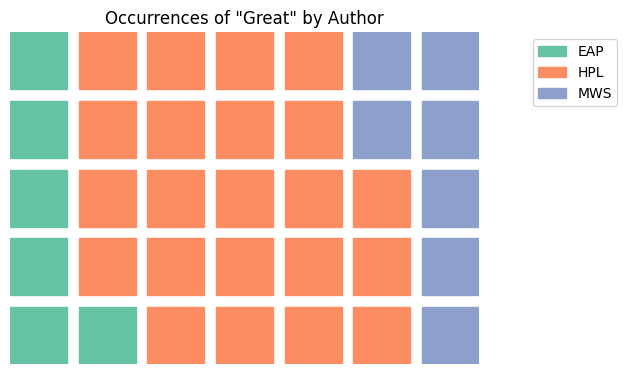

In [31]:
from pywaffle import Waffle
import matplotlib.pyplot as plt


# create a waffle chart to visualize the great_counts by author
fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=list(great_counts),
    labels=list(great_counts.index),
    legend={'loc': 'upper left', 'bbox_to_anchor': (1.1, 1)}
)

plt.title('Occurrences of "Great" by Author')
plt.show()

### 3. le mot `impossible`

In [32]:
data['word_sentence_count'] = data['text'].apply(lambda x:count_word_sentences(x,'impossible'))

impossible_counts = data.groupby('author')['word_sentence_count'].sum()

print(impossible_counts)

author
EAP    60
HPL    16
MWS    19
Name: word_sentence_count, dtype: int64


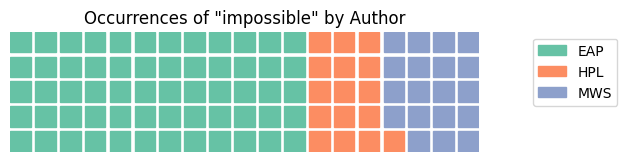

In [33]:
from pywaffle import Waffle
import matplotlib.pyplot as plt

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=list(impossible_counts),
    labels=list(impossible_counts.index),
    legend={'loc': 'upper left', 'bbox_to_anchor': (1.1, 1)}
)

plt.title('Occurrences of "impossible" by Author')
plt.show()

### 4. trois nuages de mots pour représenter les mots les plus utilisés par chaque auteur

['This', 'process,', 'however,', 'afforded', 'me', 'no', 'means', 'of', 'ascertaining', 'the', 'dimensions', 'of', 'my', 'dungeon;', 'as', 'I', 'might', 'make', 'its', 'circuit,', 'and', 'return', 'to', 'the', 'point', 'whence', 'I', 'set', 'out,', 'without', 'being', 'aware', 'of', 'the', 'fact;', 'so', 'perfectly', 'uniform', 'seemed', 'the', 'wall.', 'In', 'his', 'left', 'hand', 'was', 'a', 'gold', 'snuff', 'box,', 'from', 'which,', 'as', 'he', 'capered', 'down', 'the', 'hill,', 'cutting', 'all', 'manner', 'of', 'fantastic', 'steps,', 'he', 'took', 'snuff', 'incessantly', 'with', 'an', 'air', 'of', 'the', 'greatest', 'possible', 'self', 'satisfaction.', 'The', 'astronomer,', 'perhaps,', 'at', 'this', 'point,', 'took', 'refuge', 'in', 'the', 'suggestion', 'of', 'non', 'luminosity;', 'and', 'here', 'analogy', 'was', 'suddenly', 'let', 'fall.', 'The', 'surcingle', 'hung', 'in', 'ribands', 'from', 'my', 'body.', 'I', 'knew', 'that', 'you', 'could', 'not', 'say', 'to', 'yourself', "'ster

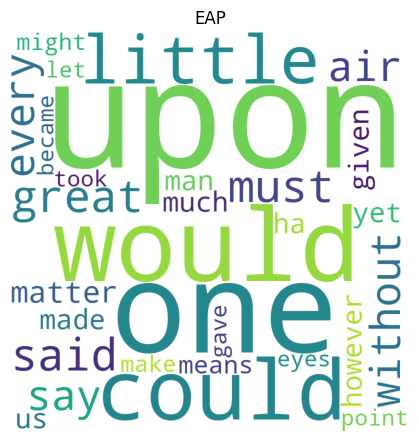

['It', 'never', 'once', 'occurred', 'to', 'me', 'that', 'the', 'fumbling', 'might', 'be', 'a', 'mere', 'mistake.', 'Finding', 'nothing', 'else,', 'not', 'even', 'gold,', 'the', 'Superintendent', 'abandoned', 'his', 'attempts;', 'but', 'a', 'perplexed', 'look', 'occasionally', 'steals', 'over', 'his', 'countenance', 'as', 'he', 'sits', 'thinking', 'at', 'his', 'desk.', 'Herbert', 'West', 'needed', 'fresh', 'bodies', 'because', 'his', 'life', 'work', 'was', 'the', 'reanimation', 'of', 'the', 'dead.', 'The', 'farm', 'like', 'grounds', 'extended', 'back', 'very', 'deeply', 'up', 'the', 'hill,', 'almost', 'to', 'Wheaton', 'Street.', 'His', 'facial', 'aspect,', 'too,', 'was', 'remarkable', 'for', 'its', 'maturity;', 'for', 'though', 'he', 'shared', 'his', "mother's", 'and', "grandfather's", 'chinlessness,', 'his', 'firm', 'and', 'precociously', 'shaped', 'nose', 'united', 'with', 'the', 'expression', 'of', 'his', 'large,', 'dark,', 'almost', 'Latin', 'eyes', 'to', 'give', 'him', 'an', 'air',

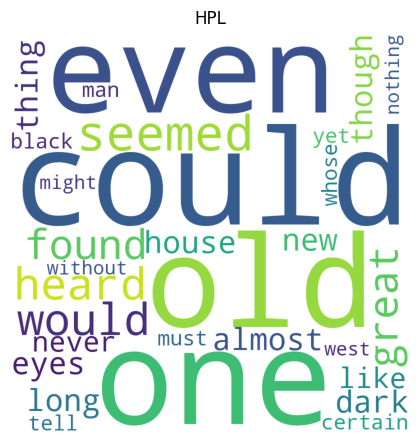

['How', 'lovely', 'is', 'spring', 'As', 'we', 'looked', 'from', 'Windsor', 'Terrace', 'on', 'the', 'sixteen', 'fertile', 'counties', 'spread', 'beneath,', 'speckled', 'by', 'happy', 'cottages', 'and', 'wealthier', 'towns,', 'all', 'looked', 'as', 'in', 'former', 'years,', 'heart', 'cheering', 'and', 'fair.', 'A', 'youth', 'passed', 'in', 'solitude,', 'my', 'best', 'years', 'spent', 'under', 'your', 'gentle', 'and', 'feminine', 'fosterage,', 'has', 'so', 'refined', 'the', 'groundwork', 'of', 'my', 'character', 'that', 'I', 'cannot', 'overcome', 'an', 'intense', 'distaste', 'to', 'the', 'usual', 'brutality', 'exercised', 'on', 'board', 'ship:', 'I', 'have', 'never', 'believed', 'it', 'to', 'be', 'necessary,', 'and', 'when', 'I', 'heard', 'of', 'a', 'mariner', 'equally', 'noted', 'for', 'his', 'kindliness', 'of', 'heart', 'and', 'the', 'respect', 'and', 'obedience', 'paid', 'to', 'him', 'by', 'his', 'crew,', 'I', 'felt', 'myself', 'peculiarly', 'fortunate', 'in', 'being', 'able', 'to', 's

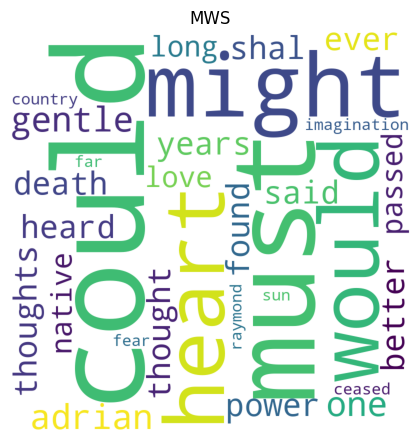

In [34]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd
import spacy
import nltk

nlp = spacy.load('en_core_web_sm')

grouped = data.groupby('author')

for author, group in grouped:
    # concatenate all the text into a single string
    text = ' '.join(group['text'])[0:20000]
    
    # tokenize the text using spaCy
    text = remove_repeating_chars(text)
    text = remove_accented_chars_func(text)
    text = remove_url_func(text)
    text = remove_html_tags_func(text)
    text = remove_email_func(text)
    text = to_lower(text)
    text = remove_punctuation(text)
    text = remove_stopwords(text)
    
    tokens = tokenize_sentence(text)
    
    # count the frequency of each word
    word_counts = Counter(tokens)
    most_common_words = word_counts.most_common(30)
    
    # generate the word cloud
    wordcloud = WordCloud(width = 800, height = 800, 
                          background_color ='white', 
                          stopwords = stopwords, 
                          min_font_size = 10).generate_from_frequencies(dict(most_common_words))
    
    # plot the WordCloud image                      
    plt.figure(figsize = (4, 4), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(author)
    
    # show the plot
    plt.show()

## 5. les 100 meilleurs mots positifs et négatifs utilisés par les auteurs

In [35]:
# (Affective Norms for English Words) score is a sentiment analysis approach that assigns a numeric score 
# to words based on their emotional polarity or sentiment. It is a pre-computed sentiment lexicon that contains
# a list of English words along with their corresponding sentiment scores.

from afinn import Afinn

In [36]:
afinn = Afinn(language='en')
afinn.score('terrible')

-3.0

['This', 'process,', 'however,', 'afforded', 'me', 'no', 'means', 'of', 'ascertaining', 'the', 'dimensions', 'of', 'my', 'dungeon;', 'as', 'I', 'might', 'make', 'its', 'circuit,', 'and', 'return', 'to', 'the', 'point', 'whence', 'I', 'set', 'out,', 'without', 'being', 'aware', 'of', 'the', 'fact;', 'so', 'perfectly', 'uniform', 'seemed', 'the', 'wall.', 'It', 'never', 'once', 'occurred', 'to', 'me', 'that', 'the', 'fumbling', 'might', 'be', 'a', 'mere', 'mistake.', 'In', 'his', 'left', 'hand', 'was', 'a', 'gold', 'snuff', 'box,', 'from', 'which,', 'as', 'he', 'capered', 'down', 'the', 'hill,', 'cutting', 'all', 'manner', 'of', 'fantastic', 'steps,', 'he', 'took', 'snuff', 'incessantly', 'with', 'an', 'air', 'of', 'the', 'greatest', 'possible', 'self', 'satisfaction.', 'How', 'lovely', 'is', 'spring', 'As', 'we', 'looked', 'from', 'Windsor', 'Terrace', 'on', 'the', 'sixteen', 'fertile', 'counties', 'spread', 'beneath,', 'speckled', 'by', 'happy', 'cottages', 'and', 'wealthier', 'towns,'

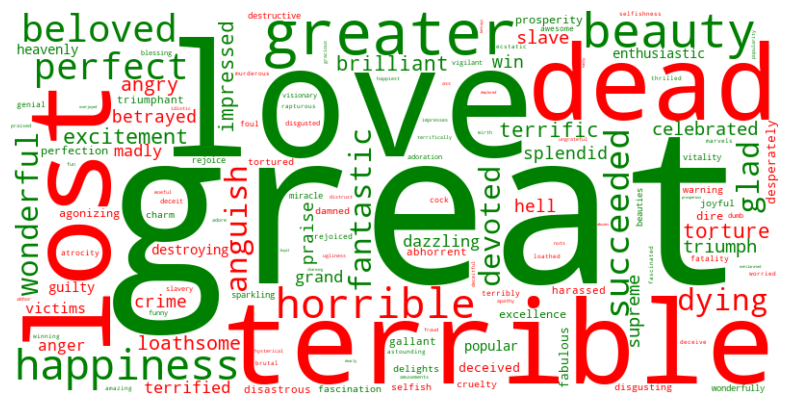

In [37]:
text = ' '.join(data['text'])
text = remove_repeating_chars(text)
text = remove_accented_chars_func(text)
text = remove_url_func(text)
text = remove_html_tags_func(text)
text = remove_email_func(text)
text = to_lower(text)
text = remove_punctuation(text)
text = remove_stopwords(text)

tokens = tokenize_sentence(text)

words = pd.DataFrame(tokens, columns=['words']).drop_duplicates()

words['score'] = words['words'].apply(afinn.score)
pos_words = words.sort_values(by='score', ascending=False).head(100)['words'].tolist()
neg_words = words.sort_values(by='score', ascending=True).head(100)['words'].tolist()

def filter_words(text):
    stop_words = set(stopwords.words('english'))
    words = text.lower().split()
    filtered_words = [word for word in words if word not in stop_words and word in pos_words + neg_words]
    return ' '.join(filtered_words)

data['filtered_text'] = data['text'].apply(filter_words)

# Join all the filtered text into a single string
all_text = ' '.join(data['filtered_text'].tolist())

def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    positive_color = 'green'
    negative_color = 'red'
    if word in pos_words:
        return positive_color
    elif word in neg_words:
        return negative_color
    else:
        return 'black'

# Generate the word cloud with custom color function
wordcloud = WordCloud(width=800, height=400, background_color='white', color_func=color_func).generate(all_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

# Saving into new dataset for the 2nd tp

In [40]:
import pandas as pd

# Assuming 'data' is a DataFrame with 'id', 'author', 'text', 'word_sentence_count', and 'filtered_text' columns
preprocessed_data = data.copy()

preprocessed_data['text'] = preprocessed_data['text'].apply(remove_repeating_chars)
preprocessed_data['text'] = preprocessed_data['text'].apply(remove_accented_chars_func)
preprocessed_data['text'] = preprocessed_data['text'].apply(remove_url_func)
preprocessed_data['text'] = preprocessed_data['text'].apply(remove_html_tags_func)
preprocessed_data['text'] = preprocessed_data['text'].apply(remove_email_func)
preprocessed_data['text'] = preprocessed_data['text'].apply(to_lower)
preprocessed_data['text'] = preprocessed_data['text'].apply(remove_punctuation)
preprocessed_data['text'] = preprocessed_data['text'].apply(remove_stopwords)

['This', 'process,', 'however,', 'afforded', 'me', 'no', 'means', 'of', 'ascertaining', 'the', 'dimensions', 'of', 'my', 'dungeon;', 'as', 'I', 'might', 'make', 'its', 'circuit,', 'and', 'return', 'to', 'the', 'point', 'whence', 'I', 'set', 'out,', 'without', 'being', 'aware', 'of', 'the', 'fact;', 'so', 'perfectly', 'uniform', 'seemed', 'the', 'wall.']
['It', 'never', 'once', 'occurred', 'to', 'me', 'that', 'the', 'fumbling', 'might', 'be', 'a', 'mere', 'mistake.']
['In', 'his', 'left', 'hand', 'was', 'a', 'gold', 'snuff', 'box,', 'from', 'which,', 'as', 'he', 'capered', 'down', 'the', 'hill,', 'cutting', 'all', 'manner', 'of', 'fantastic', 'steps,', 'he', 'took', 'snuff', 'incessantly', 'with', 'an', 'air', 'of', 'the', 'greatest', 'possible', 'self', 'satisfaction.']
['How', 'lovely', 'is', 'spring', 'As', 'we', 'looked', 'from', 'Windsor', 'Terrace', 'on', 'the', 'sixteen', 'fertile', 'counties', 'spread', 'beneath,', 'speckled', 'by', 'happy', 'cottages', 'and', 'wealthier', 'town

In [ ]:
preprocessed_data['text'] = preprocessed_data['text'].apply(tokenize_sentences_with_bpe)

In [39]:


preprocessed_data['text'] = preprocessed_data['text'].apply(reduction_spacy)



preprocessed_data = preprocessed_data.drop(['word_sentence_count', 'filtered_text'], axis=1)

preprocessed_data.to_csv('preprocessed_data.csv', index=False)

['This', 'process,', 'however,', 'afforded', 'me', 'no', 'means', 'of', 'ascertaining', 'the', 'dimensions', 'of', 'my', 'dungeon;', 'as', 'I', 'might', 'make', 'its', 'circuit,', 'and', 'return', 'to', 'the', 'point', 'whence', 'I', 'set', 'out,', 'without', 'being', 'aware', 'of', 'the', 'fact;', 'so', 'perfectly', 'uniform', 'seemed', 'the', 'wall.']
['It', 'never', 'once', 'occurred', 'to', 'me', 'that', 'the', 'fumbling', 'might', 'be', 'a', 'mere', 'mistake.']
['In', 'his', 'left', 'hand', 'was', 'a', 'gold', 'snuff', 'box,', 'from', 'which,', 'as', 'he', 'capered', 'down', 'the', 'hill,', 'cutting', 'all', 'manner', 'of', 'fantastic', 'steps,', 'he', 'took', 'snuff', 'incessantly', 'with', 'an', 'air', 'of', 'the', 'greatest', 'possible', 'self', 'satisfaction.']
['How', 'lovely', 'is', 'spring', 'As', 'we', 'looked', 'from', 'Windsor', 'Terrace', 'on', 'the', 'sixteen', 'fertile', 'counties', 'spread', 'beneath,', 'speckled', 'by', 'happy', 'cottages', 'and', 'wealthier', 'town

KeyboardInterrupt: 